In [380]:
%matplotlib inline

from collections import defaultdict
import numpy as np
import pandas as pd
import thinkstats2
import matplotlib.pyplot as plt

In [381]:
df = pd.read_excel('globalterrorismdb_0616dist.xlsx')

In [382]:
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,0,0,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [383]:
import thinkplot

In [384]:
def groupByYear(df, columns, func=np.mean):
    years = df[columns].groupby(['iyear'])
    data = years.aggregate(func)
    data['year'] = data.index
    return data

data = groupByYear(df, ['iyear', 'nkill'])

In [385]:
import statsmodels.formula.api as smf

def LinReg(data, formula):
    model = smf.ols(formula, data=data)
    results = model.fit()
    inter = results.params['Intercept']
    slope = results.params['year']
    return model, results, inter, slope

model, results,inter, slope = LinReg(data, 'nkill ~ year')
print(slope, results.pvalues['year'], results.rsquared)

(0.041849601420865037, 0.0010715000347732353, 0.22250602492616434)


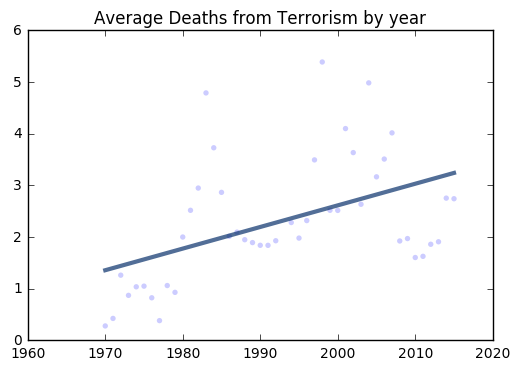

In [386]:
def PlotFittedValues(model, results, title='', label=''):
    years = model.exog[:,1]
    values = model.endog
    thinkplot.Config(title=title)
    thinkplot.Scatter(years, values, s=15, label=label)
    thinkplot.Plot(years, results.fittedvalues, label='model')

PlotFittedValues(model, results, 'Average Deaths from Terrorism by year')

(154.93908328902143, 2.712724393043929e-06, 0.40403794396069126)


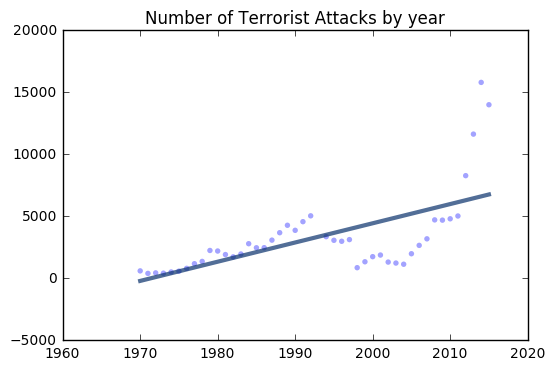

In [387]:
years2 = df[['iyear', 'nkill']].groupby(['iyear'])
data2 = years2['nkill'].count()

thinkplot.Scatter(data2.index, data2.values, s=15, label='')
d = {'year':data2.index, 'number':data2.values}
newdf = pd.DataFrame(data=d)
model2, results2,inter2, slope = LinReg(newdf, 'number ~ year')
print(slope, results2.pvalues['year'], results2.rsquared)
PlotFittedValues(model2, results2, 'Number of Terrorist Attacks by year')

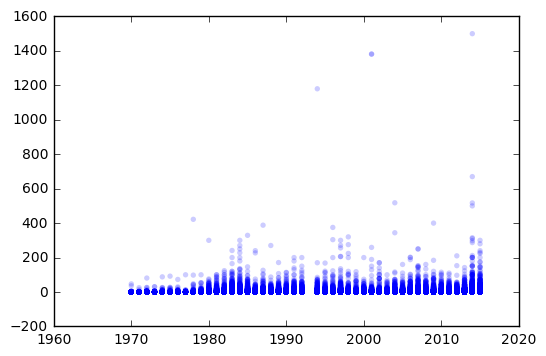

In [388]:
thinkplot.Scatter(df.iyear, df.nkill, s=15, label='')

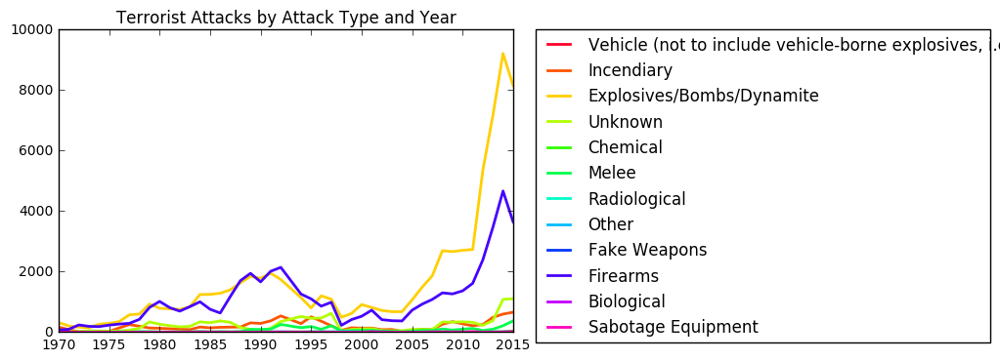

In [389]:
regions = df[['iyear', 'nkill', 'weaptype1_txt']].groupby(['weaptype1_txt'])
d = {}
for name, region in regions:
    d[name] = region.groupby(['iyear'])['nkill'].count()
    
ts = df.iyear.value_counts().sort_index().index
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_subplot(111)
colors = plt.cm.gist_rainbow(np.linspace(0, 1, 12))

for i, (region, data) in enumerate(d.items()):
    plt.plot(data.index, data.values, color=colors[i], linewidth=2.0, label=region)

plt.legend(bbox_to_anchor=(1.05, 1.00, 1., 0),
           ncol=1, mode="expand", borderaxespad=0.)
ax.set_title('Terrorist Attacks by Attack Type and Year')
plt.show()

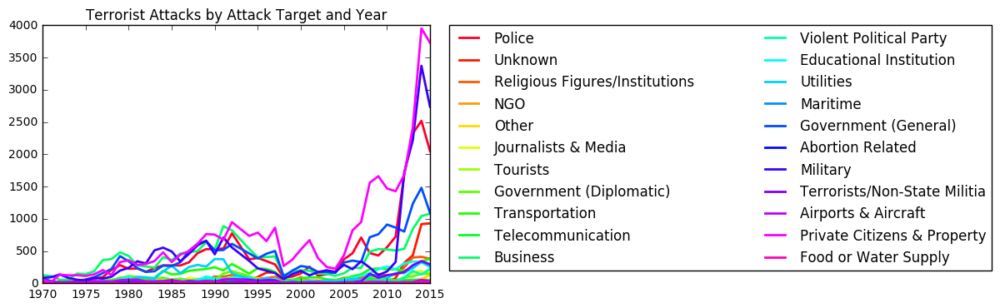

In [390]:
regions = df[['iyear', 'nkill', 'targtype1_txt']].groupby(['targtype1_txt'])
d = {}
for name, region in regions:
    d[name] = region.groupby(['iyear'])['nkill'].count()
    
ts = df.iyear.value_counts().sort_index().index
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_subplot(111)
colors = plt.cm.gist_rainbow(np.linspace(0, 1, 22))

for i, (region, data) in enumerate(d.items()):
    plt.plot(data.index, data.values, color=colors[i], linewidth=2.0, label=region)

plt.legend(bbox_to_anchor=(1.05, 1.00, 1.4, 0),
           ncol=2, mode="expand", borderaxespad=0.)
ax.set_title('Terrorist Attacks by Attack Target and Year')
plt.show()

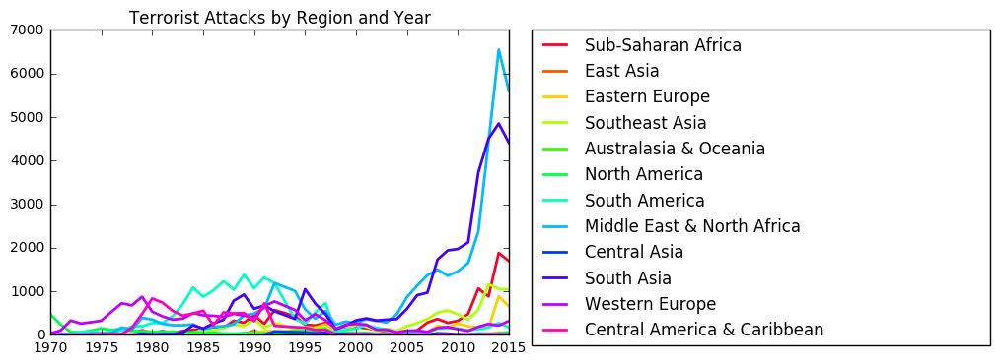

In [391]:
regions = df[['iyear', 'nkill', 'region_txt']].groupby(['region_txt'])
d = {}
for name, region in regions:
    d[name] = region.groupby(['iyear'])['nkill'].count()
    
ts = df.iyear.value_counts().sort_index().index
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_subplot(111)
colors = plt.cm.gist_rainbow(np.linspace(0, 1, 12))

for i, (region, data) in enumerate(d.items()):
    plt.plot(data.index, data.values, color=colors[i], linewidth=2.0, label=region)

plt.legend(bbox_to_anchor=(1.05, 1.00, 1., 0),
           ncol=1, mode="expand", borderaxespad=0.)
ax.set_title('Terrorist Attacks by Region and Year')
plt.show()

In [392]:
import datetime
monthCorrect = df[df.imonth != 0]
dayCorrect = df[df.iday != 0]
dayCorrect2 = dayCorrect.copy()
ts = []
for index, year in dayCorrect.iyear.iteritems():
    ts.append(datetime.date(dayCorrect.loc[index].iyear, dayCorrect.loc[index].imonth, dayCorrect.loc[index].iday))
# dayCorrect['timeStamp'] = datetime.datetime(dayCorrect.iyear, dayCorrect.imonth, dayCorrect.iday)



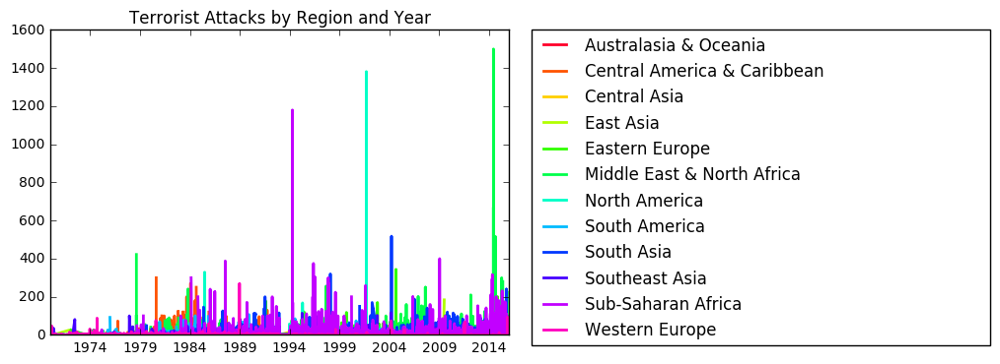

In [393]:
dayCorrect2 = dayCorrect.copy()
dayCorrect2['time']=ts
regions = dayCorrect2[['time', 'nkill', 'region_txt']].groupby(['region_txt'])
d = {}
fig = plt.figure()
ax = fig.add_subplot(111)
colors = plt.cm.gist_rainbow(np.linspace(0, 1, 12))
i=0
for name, region in regions:
    plt.plot(region.time, region.nkill, color=colors[i], linewidth=2.0, label=name)
    i+=1
    
plt.legend(bbox_to_anchor=(1.05, 1.00, 1., 0),
           ncol=1, mode="expand", borderaxespad=0.)
ax.set_title('Terrorist Attacks by Region and Year')
plt.show()

In [394]:
regions = df[['iyear', 'nkill', 'gname']].groupby(['gname'])
d = {}
for name, region in regions:
    d[name] = region.groupby(['iyear'])['nkill'].count()
    
ts = df.iyear.value_counts().sort_index().index
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_subplot(111)
colors = plt.cm.Blues(np.linspace(0, 1, len(pd.unique(df.gname))))

for i, (region, data) in enumerate(d.items()):
    plt.plot(data.index, data.values, color=colors[i], linewidth=2.0, label=region)

plt.legend(bbox_to_anchor=(2.0, 1.00, 1., 0),
           ncol=2, mode="expand", borderaxespad=0.)
ax.set_title('Terrorist Attacks by Region and Year')
plt.show()

In [395]:
gdp = pd.read_excel('pwt90.xlsx', sheetname='Data')

In [396]:
noDoubt = df[df.doubtterr==0]

In [397]:
float(noDoubt.size)/float(df.size)*100

75.75204755951319

In [398]:
import iso3166

In [399]:
dne = []
for name, val in df.country_txt.value_counts().iteritems():
    try:
        iso3166.countries_by_name[name.upper()]
    except:
        dne.append(name)
dne

[u'United Kingdom',
 u'Russia',
 u'West Bank and Gaza Strip',
 u'Syria',
 u'Iran',
 u'West Germany (FRG)',
 u'Democratic Republic of the Congo',
 u'Bolivia',
 u'Venezuela',
 u'Yugoslavia',
 u'Kosovo',
 u'Bosnia-Herzegovina',
 u'Macedonia',
 u'Rhodesia',
 u'Soviet Union',
 u'Ivory Coast',
 u'Tanzania',
 u'Zaire',
 u'Taiwan',
 u'East Germany (GDR)',
 u'South Korea',
 u'Macau',
 u'Czech Republic',
 u'Laos',
 u'Republic of the Congo',
 u'Moldova',
 u'Slovak Republic',
 u'Serbia-Montenegro',
 u'Vietnam',
 u'Czechoslovakia',
 u'East Timor',
 u'North Yemen',
 u"People's Republic of the Congo",
 u'South Yemen',
 u'St. Kitts and Nevis',
 u'International',
 u'Vatican City',
 u'North Korea',
 u'New Hebrides',
 u'South Vietnam',
 u'Falkland Islands',
 u'Brunei',
 u'St. Lucia']

I ran the following code to replace most country names to match ISO.

df.country_txt.replace(to_replace='St. Kitts and Nevis',value=str(iso3166.countries_by_alpha2['KN'].name), inplace=True)

In [400]:
df.country_txt.replace(to_replace='Slovak Republic',value=iso3166.countries_by_alpha2['SK'].name, inplace=True)

In [401]:
iso3166.countries_by_alpha2['SK'].name

u'Slovakia'

In [402]:
pd.unique(gdp.country.ravel())

array([u'Aruba', u'Angola', u'Anguilla', u'Albania',
       u'United Arab Emirates', u'Argentina', u'Armenia',
       u'Antigua and Barbuda', u'Australia', u'Austria', u'Azerbaijan',
       u'Burundi', u'Belgium', u'Benin', u'Burkina Faso', u'Bangladesh',
       u'Bulgaria', u'Bahrain', u'Bahamas', u'Bosnia and Herzegovina',
       u'Belarus', u'Belize', u'Bermuda',
       u'Bolivia (Plurinational State of)', u'Brazil', u'Barbados',
       u'Brunei Darussalam', u'Bhutan', u'Botswana',
       u'Central African Republic', u'Canada', u'Switzerland', u'Chile',
       u'China', u"C\xf4te d'Ivoire", u'Cameroon', u'D.R. of the Congo',
       u'Congo', u'Colombia', u'Comoros', u'Cabo Verde', u'Costa Rica',
       u'Cura\xe7ao', u'Cayman Islands', u'Cyprus', u'Czech Republic',
       u'Germany', u'Djibouti', u'Dominica', u'Denmark',
       u'Dominican Republic', u'Algeria', u'Ecuador', u'Egypt', u'Spain',
       u'Estonia', u'Ethiopia', u'Finland', u'Fiji', u'France', u'Gabon',
       u'United 

In [403]:
len(pd.unique(df.gname.ravel()))

3290

In [404]:
def countryToISO3(row):
    try:
        iso = iso3166.countries_by_name[row['country_txt'].upper()].alpha3
    except:
        iso = 'NAN'
    return iso

df['iso3'] = df.apply(countryToISO3, axis=1)


In [405]:
gd.columns

NameError: name 'gd' is not defined

In [ ]:
joined = pd.merge(df, gdp, how='left', left_on=['iyear', 'iso3'], right_on=['year', 'countrycode'])

In [ ]:
aqap = joined[joined.gname=='Al-Qaida in the Arabian Peninsula (AQAP)']
taliban = joined[joined.gname=='Taliban']
isil = joined[joined.gname=='Islamic State of Iraq and the Levant (ISIL)']
alsha = joined[joined.gname=='Al-Shabaab']

In [ ]:
hist= thinkstats2.Hist(joined[joined.INT_LOG==1].rgdpe.dropna())
thinkplot.Pmf(hist)

In [ ]:
hist= thinkstats2.Hist(joined[joined.INT_LOG==1]['pop'].dropna())
thinkplot.Pmf(hist)

In [ ]:
thinkplot.Scatter(joined[joined.INT_LOG==1][['pop', 'nkill']].dropna()['pop'],joined[joined.INT_LOG==1][['pop', 'nkill']].dropna()['nkill'])

In [ ]:
hist= thinkstats2.Hist(isil[isil.INT_LOG==1].rgdpe.dropna())
thinkplot.Hist(hist)


In [ ]:
hist= thinkstats2.Hist(isil['pop'].dropna())
thinkplot.Pmf(hist)


In [ ]:
thinkplot.Scatter(isil[['pop', 'nkill']].dropna()['pop'],isil[['pop', 'nkill']].dropna()['nkill'])

In [ ]:
float(df.gname.value_counts().max())/float(df.gname.value_counts().sum())

In [ ]:
float(df.INT_LOG.value_counts().max())/float(df.INT_LOG.value_counts().sum())

In [ ]:
df.INT_LOG.value_counts(),df[df.INT_LOG==0].iyear.count()

In [ ]:
unknown = df.INT_LOG.value_counts().max()
international = df.INT_LOG.value_counts().min()
domestic = df[df.INT_LOG==0].iyear.count()
domes = []
inters = []
ps = []
for i in range(100):
    inter = unknown*i/100.0 +international
    dome = (1-i/100.0)*unknown+domestic
    inters.append(unknown*i/100.0 +international)
    domes.append((1-i/100.0)*unknown+domestic)
    ps.append(inter/float(inter+dome)*100)

In [ ]:
unkown, international, domestic

In [ ]:
bools = np.array(ps)>50
bools[-14]

In [ ]:
hist= thinkstats2.Hist(taliban[taliban.INT_LOG==1]['rgdpe'].dropna())
thinkplot.Pmf(hist)

In [ ]:
hist= thinkstats2.Hist(aqap[aqap.INT_LOG==1]['rgdpe'].dropna())
thinkplot.Pmf(hist)

In [ ]:
groups = joined[joined.INT_LOG==1].groupby(['gname'])
data3 = groups['nkill'].count()

In [ ]:
data3[data3>100]

In [ ]:
alsha[alsha.INT_LOG==1]

In [ ]:
df[(df.gname=='Islamic State of Iraq and the Levant (ISIL)') & (df.INT_LOG==1)]